In [1]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0


In [2]:
!nvidia-smi

Wed Mar  6 07:36:49 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0              26W / 250W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!python --version

Python 3.10.13


In [4]:
%cd /kaggle/working

/kaggle/working


In [5]:
# !pip install torch==1.7.0 torchvision==0.8.0
!pip install torch==1.12.0 torchvision==0.13.0 torchaudio==0.12.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.3/776.3 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 16.4 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.1.2
    Uninstalling torch-2.1.2:
      Successfully uninstalled torch-2.1.2
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.16.2
    Uninstalling torchvision-0.16.2:
      Successfully uninstalled torchvision-0.16.2
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 2.1.2
    Uninstalling torchaudio-2.1.2:
      Successfully uninstalled torchaudio-2.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pytorch-lightning 2.2.0.post0 requires torch>=1.13.0, but you have torch 1.12.0 which is incompatib

In [6]:
!pip install -U openmim
# Install mmengine
!mim install mmengine
# Install MMCV
!mim install 'mmcv >= 2.0.0rc1'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.1/443.1 kB 22.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 6.9 MB/s eta 0:00:00
  Created wheel for oss2: filename=oss2-2.17.0-py3-none-any.whl size=112371 sha256=d25881393dfa2879923072b3626ccd

# **RESTART KERNEL BEFORE GOING FURTHER**

In [7]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
print(torchvision.__version__)

1.12.0+cu102 True
0.13.0+cu102


/opt/conda/lib/python3.10/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (2.1.0) or chardet (None)/charset_normalizer (3.3.2) doesn't match a supported version!
  warnings.warn(


In [8]:
!rm -r mmsegmentation
!git clone -b main https://github.com/open-mmlab/mmsegmentation.git 
%cd mmsegmentation
# !pip install -v -e .
!python setup.py build
!pip install .
%cd ..

rm: cannot remove 'mmsegmentation': No such file or directory
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 16444, done.
remote: Counting objects: 100% (116/116), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 16444 (delta 37), reused 60 (delta 18), pack-reused 16328
Receiving objects: 100% (16444/16444), 43.83 MiB | 29.14 MiB/s, done.
Resolving deltas: 100% (11420/11420), done.
/kaggle/working/mmsegmentation
/opt/conda/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==60.2.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
runn

In [9]:
# Check MMSegmentation installation
import mmseg,mmcv,mmengine
print(mmseg.__version__,mmcv.__version__,mmengine.__version__)

1.2.2 2.1.0 0.10.3


In [10]:
# Let's take a look at the dataset
import mmcv
import mmengine
import matplotlib.pyplot as plt
import os

In [11]:
# define dataset root and directory for images and annotations
data_root = '/kaggle/input/samplezip/content/drive/MyDrive/Thesis_Code_msee/FloodNet_myData'
img_dir = 'images'
ann_dir = 'annotations'

In [12]:
import pandas as pd
# define class and palette for better visualization
df=pd.read_csv('/kaggle/input/samplezip/content/drive/MyDrive/Thesis_Code_msee/FloodNet_myData/Now_class_dict_seg_10clss.csv')
classes = df['name']
palette = df[[' r', ' g', ' b']].values
id2label = classes.to_dict()
label2id = {v: k for k, v in id2label.items()}
print("classes", len(id2label))
print(classes)
print(palette)
classes=list(classes)
palette=list(palette)
num_classes=len(id2label)

classes 10
0         Background
1    BuildingFlooded
2        BNonFlooded
3        RoadFlooded
4        RNonFlooded
5              Water
6               Tree
7             Vecile
8               Pool
9              Grass
Name: name, dtype: object
[[  0   0   0]
 [255   0   0]
 [181  72  72]
 [150 150   0]
 [135 135 135]
 [  0 224 224]
 [  0   0 225]
 [204   0 204]
 [237 237   0]
 [  0 225   0]]


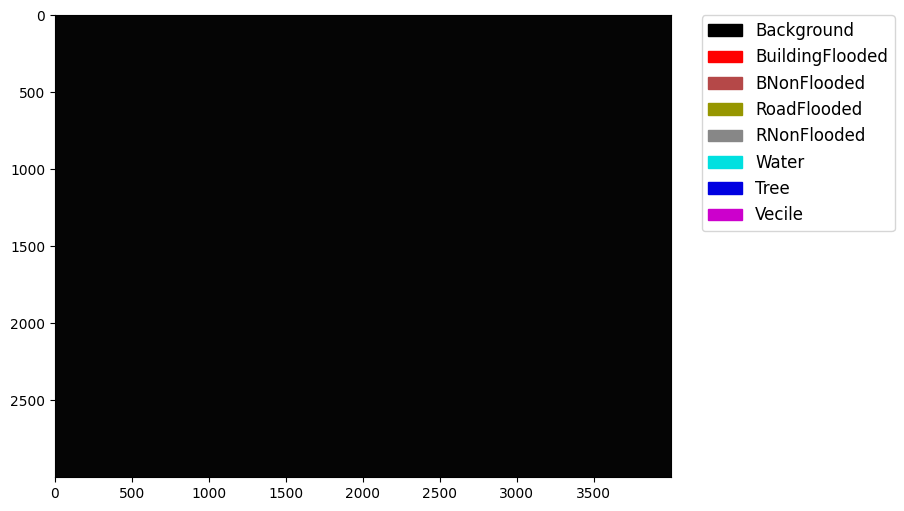

In [13]:
# Let's take a look at the segmentation map we got
import matplotlib.patches as mpatches
from PIL import Image
import numpy as np
img = Image.open('/kaggle/input/samplezip/content/drive/MyDrive/Thesis_Code_msee/FloodNet_myData/annotations/training/10166_lab.png')

plt.figure(figsize=(8, 6))
im = plt.imshow(np.array(img.convert('RGB')))

# create a patch (proxy artist) for every color
patches = [mpatches.Patch(color=np.array(palette[i])/255.,
                          label=classes[i]) for i in range(8)]
# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize='large')

plt.show()

In [14]:
!pip install ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 2.4 MB/s eta 0:00:00


In [15]:
from mmseg.registry import DATASETS
from mmseg.datasets import BaseSegDataset


@DATASETS.register_module()
class ImageSegmentationDataset(BaseSegDataset):
    METAINFO = dict(classes = classes, palette = palette)
    def __init__(self, **kwargs):
        super().__init__(img_suffix='.jpg', seg_map_suffix="_lab.png", **kwargs)


%cd /kaggle/working
!rm -r checkpoint
!mkdir checkpoint

/kaggle/working
rm: cannot remove 'checkpoint': No such file or directory


In [16]:
from mmengine import Config
cfg = Config.fromfile('/kaggle/input/segformerb5-trainedsaved-upw/checkpoint/segformer_mit-b5_8xb2-160k_ade20k-512x512.py')
checkpoint_path = '/kaggle/input/segformerb5-trainedsaved-upw/checkpoint/iter_38000.pth'
cfg.load_from = checkpoint_path


from mmengine.runner import Runner
runner = Runner.from_cfg(cfg)


03/06 07:39:54 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 0
    GPU 0: Tesla P100-PCIE-16GB
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.1, V12.1.105
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.12.0+cu102
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 10.2
  - NVCC architecture flags: -gencode;arch=compute_

/opt/conda/lib/python3.10/site-packages/mmseg/models/backbones/mit.py:365: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/opt/conda/lib/python3.10/site-packages/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/opt/conda/lib/python3.10/site-packages/mmseg/models/losses/cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


03/06 07:40:01 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
03/06 07:40:01 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
 -------------------- 
before_train_iter:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
 -------------------- 
after_train_iter:
(VERY_HIGH   ) RuntimeInfoHook                

/opt/conda/lib/python3.10/site-packages/mmseg/engine/hooks/visualization_hook.py:60: UserWarning: The draw is False, it means that the hook for visualization will not take effect. The results will NOT be visualized or stored.
  warnings.warn('The draw is False, it means that the '


In [17]:
# start training
runner.test()

/opt/conda/lib/python3.10/site-packages/mmseg/datasets/transforms/loading.py:83: UserWarning: `reduce_zero_label` will be deprecated, if you would like to ignore the zero label, please set `reduce_zero_label=True` when dataset initialized
  warnings.warn('`reduce_zero_label` will be deprecated, '


03/06 07:40:03 - mmengine - WARNING - The prefix is not set in metric class IoUMetric.
Loads checkpoint by local backend from path: /kaggle/input/segformerb5-trainedsaved-upw/checkpoint/iter_38000.pth
03/06 07:40:14 - mmengine - INFO - Load checkpoint from /kaggle/input/segformerb5-trainedsaved-upw/checkpoint/iter_38000.pth
03/06 07:40:59 - mmengine - INFO - Iter(test) [100/450]    eta: 0:02:39  time: 0.4309  data_time: 0.2469  memory: 3851  
03/06 07:41:46 - mmengine - INFO - Iter(test) [200/450]    eta: 0:01:55  time: 0.5484  data_time: 0.3668  memory: 1526  
03/06 07:42:31 - mmengine - INFO - Iter(test) [300/450]    eta: 0:01:08  time: 0.4445  data_time: 0.2379  memory: 1514  
03/06 07:43:14 - mmengine - INFO - Iter(test) [400/450]    eta: 0:00:22  time: 0.4340  data_time: 0.2370  memory: 1347  
03/06 07:43:36 - mmengine - INFO - per class results:
03/06 07:43:36 - mmengine - INFO - 
+-----------------+-------+-------+-------+--------+-----------+--------+
|      Class      |  IoU  

{'aAcc': 86.9,
 'mIoU': 57.75,
 'mAcc': 67.99,
 'mDice': 70.38,
 'mFscore': 70.38,
 'mPrecision': 75.39,
 'mRecall': 67.99}

In [18]:
from mmseg.apis import init_model, inference_model, show_result_pyplot

# Init the model from the config and the checkpoint
from mmengine import Config
#cfg = Config.fromfile('/kaggle/input/deeplabv3-trainedsaved-models/checkpoint/deeplabv3plus_r101-d8_4xb4-160k_ade20k-512x512.py')
#checkpoint_path = '/kaggle/input/deeplabv3-trainedsaved-models/checkpoint/iter_31000.pth'
model = init_model(cfg, checkpoint_path, 'cuda:0')

/opt/conda/lib/python3.10/site-packages/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/opt/conda/lib/python3.10/site-packages/mmseg/models/losses/cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


Loads checkpoint by local backend from path: /kaggle/input/segformerb5-trainedsaved-upw/checkpoint/iter_38000.pth


In [19]:

import torch
from torch import nn
import os
from PIL import Image
import pandas as pd
import cv2
import numpy as np

#Perfect
# True mask same colour,  Add metrix measure General Testing Module
from glob import glob
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

idx1=1
@torch.no_grad()
def evaluate_test(idx1=idx1):
    images_path = r'../input/samplezip/content/drive/MyDrive/Thesis_Code_msee/FloodNet_myData/images/testing/'
    masks_path = r'../input/samplezip/content/drive/MyDrive/Thesis_Code_msee/FloodNet_myData/annotations/testing/'
    images = glob(images_path + '*.jpg')
    masks = glob(masks_path + '*.png')
    images = sorted([str(p) for p in images])
    masks = sorted([str(p) for p in masks])
    #idx1 = np.random.randint(len(images))

    image = cv2.imread(images[idx1])
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    mask = cv2.imread(masks[idx1], 0)

    img = mmcv.imread(images[idx1])
    result = inference_model(model, img)
    #vis_result = show_result_pyplot(model, img, result)
    #vis_result = show_result_pyplot(model, img, result, save_dir='/kaggle/working/')
    #predicted_s= vis_result
    #predicted_s= mmcv.bgr2rgb(vis_result)
    
    ##################################################################################################
    # Define colors for each class
    colors = palette

    # Get the segmentation result
    pred_sem_seg = result.pred_sem_seg.data.cpu().numpy()

    # Initialize an empty RGB image for visualization
    h, w = pred_sem_seg.shape[1:]
    rgb_image = np.zeros((h, w, 3), dtype=np.uint8)

    # Assign colors to each pixel based on the predicted class
    for i in range(len(colors)):
        rgb_image[pred_sem_seg[0] == i] = colors[i]
    ##################################################################################################

    # Plot Image + Ground Truth
    map = np.array(mask)
    classes_map = np.unique(map).tolist()
    color_seg = np.zeros((map.shape[0], map.shape[1], 3), dtype=np.uint8) # height, width, 3
    #palette = np.array(palette)
    for label, color in enumerate(palette):
        color_seg[map == label, :] = color
    # Convert to BGR
    color_seg = color_seg[..., ::-1]
    ground_truth = cv2.cvtColor(color_seg, cv2.COLOR_BGR2RGB)

    img = np.array(image) * 0.5 + ground_truth * 0.5
    img = img.astype(np.uint8)

    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].set_title('Origional Image')
    axs[0].imshow(image)

    axs[1].set_title('ground_truth')
    axs[1].imshow(ground_truth)
    plt.show()


    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].set_title('Origional Image + ground_truth')
    axs[0].imshow(img)


    axs[1].set_title('Model_predicted')
    axs[1].imshow(rgb_image)
    plt.show()









Test_Image # 4


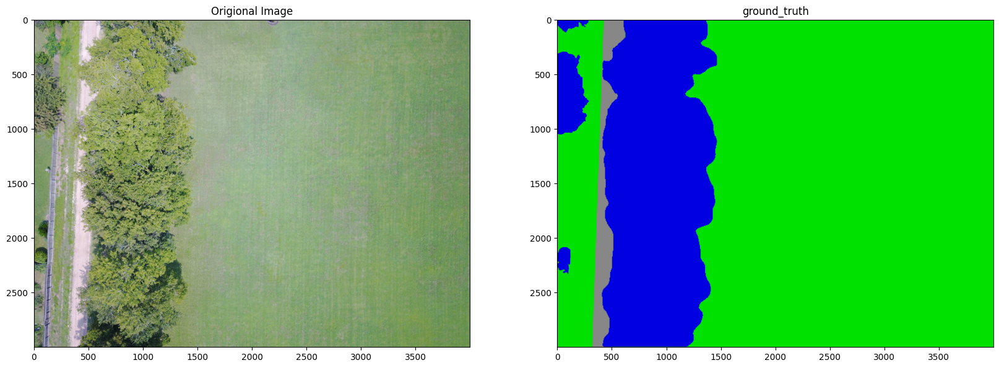

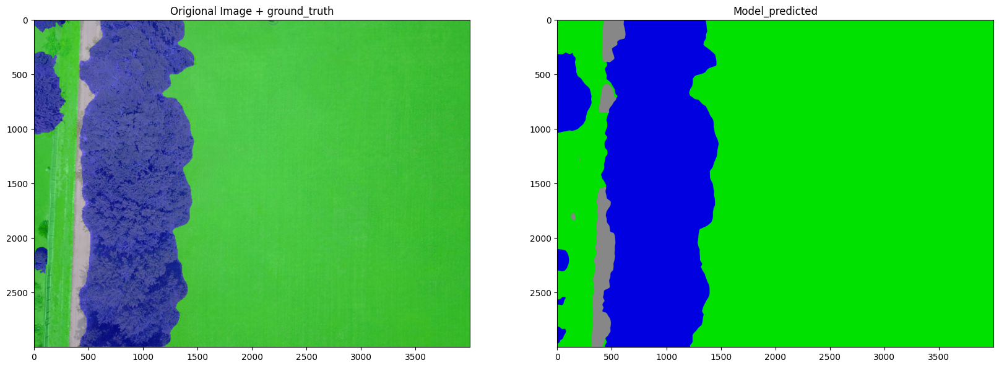




Test_Image # 5


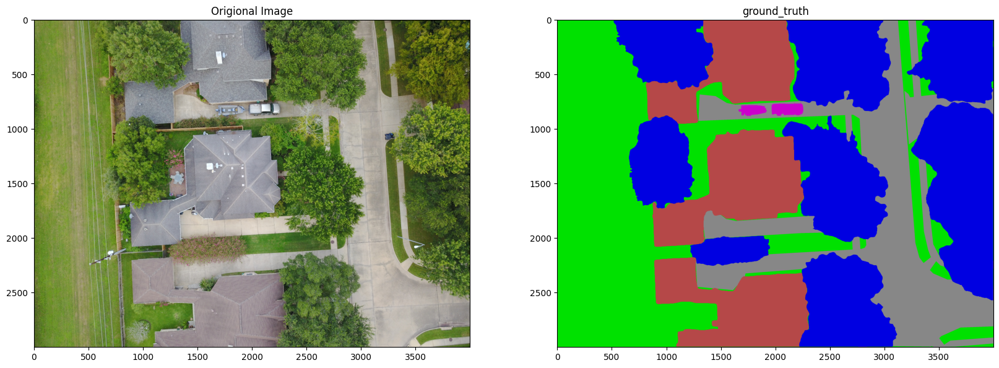

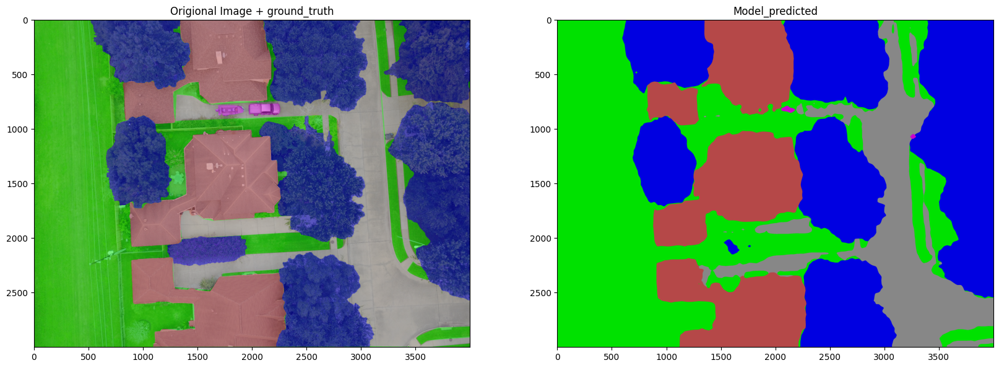




Test_Image # 6


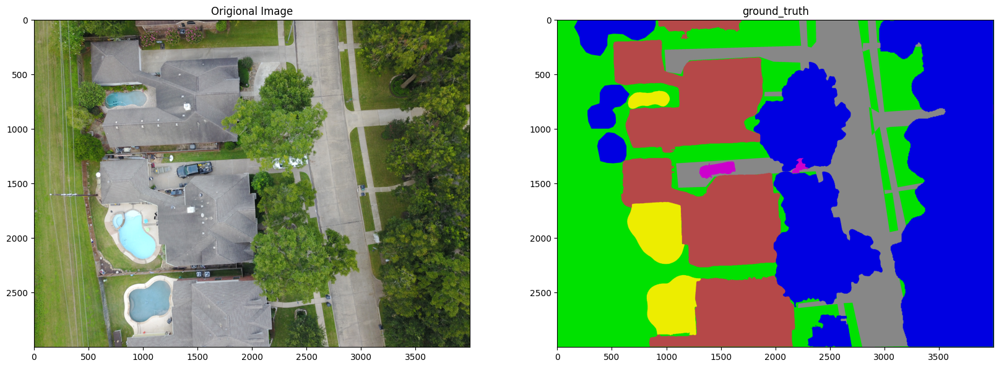

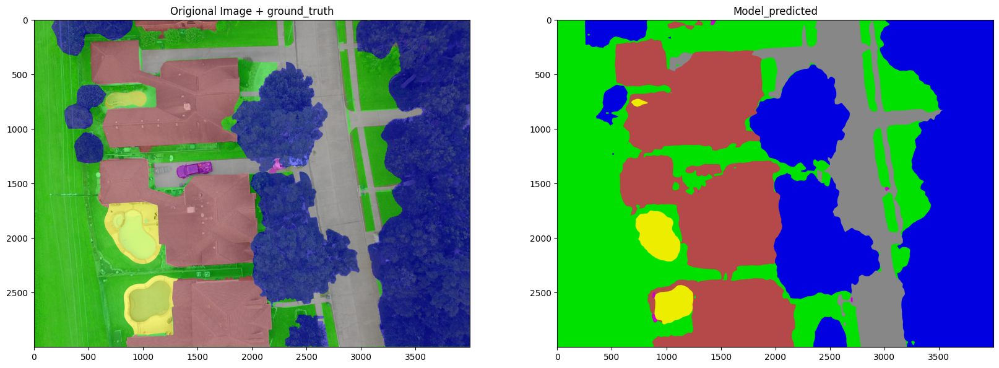




Test_Image # 7


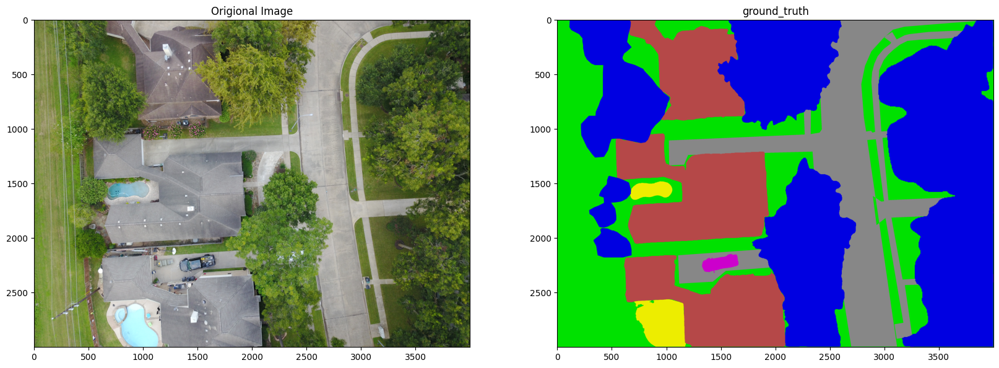

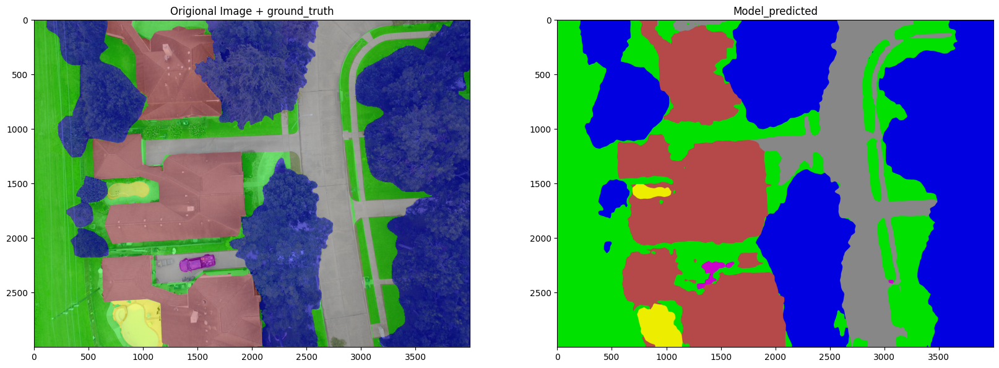




Test_Image # 8


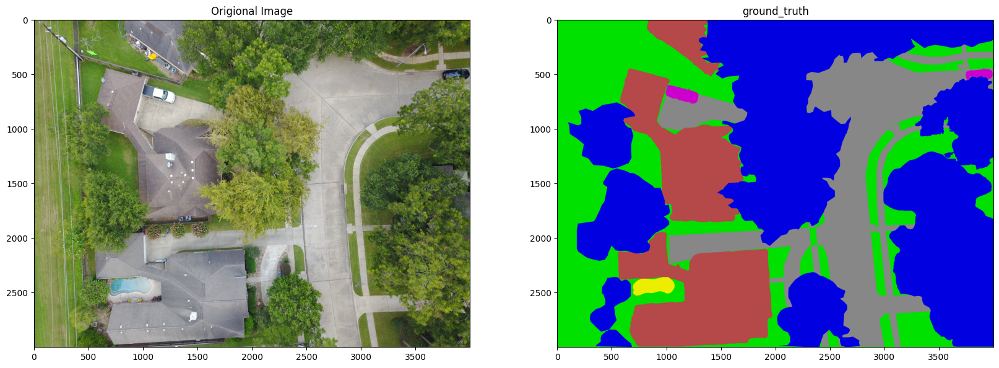

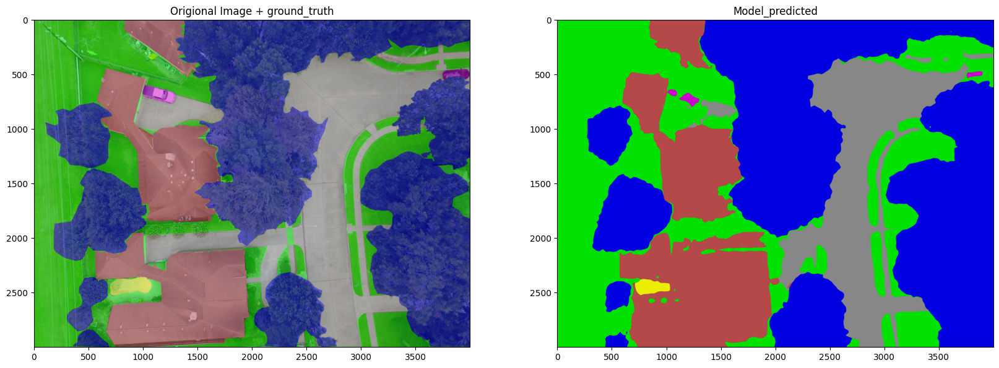




Test_Image # 9


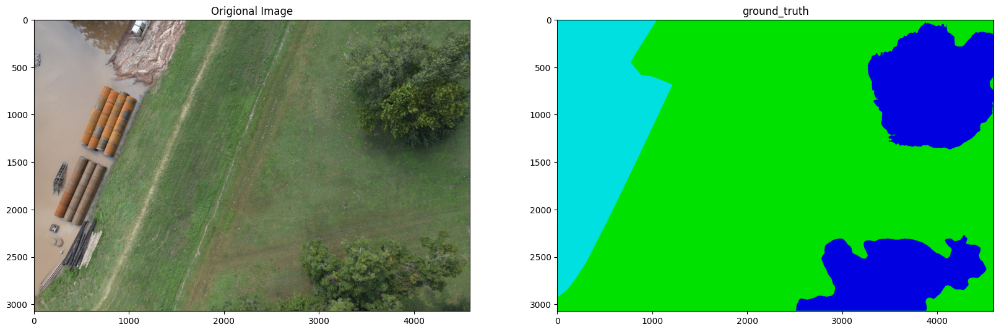

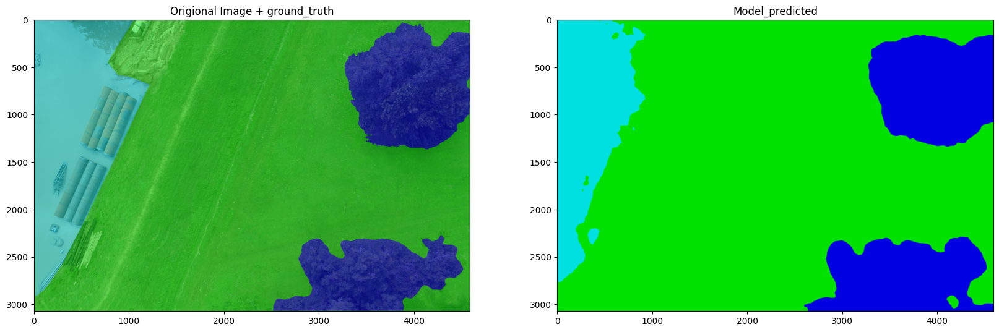




Test_Image # 10


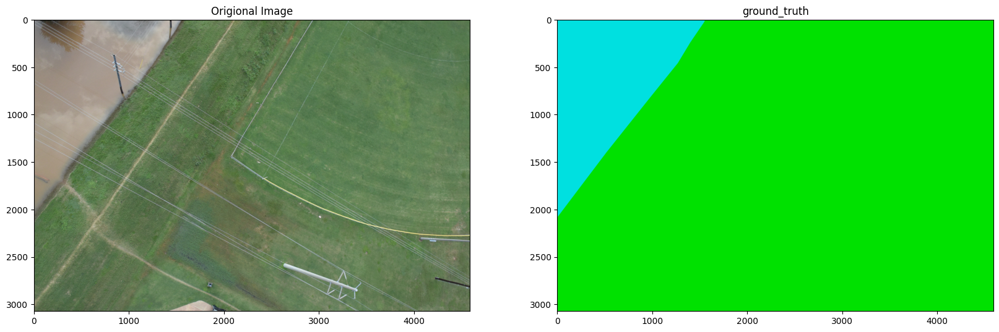

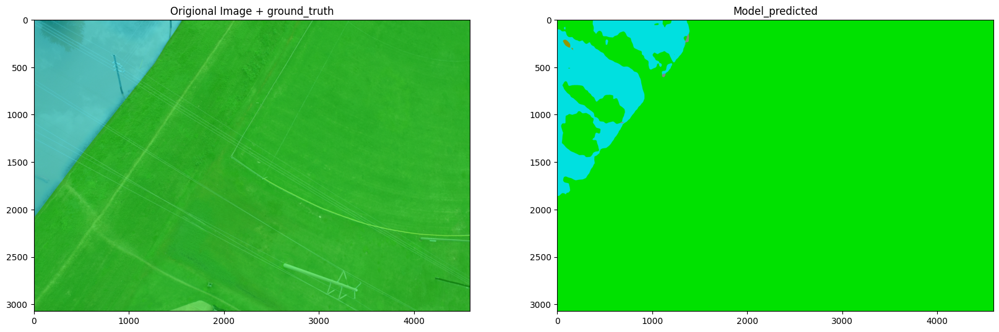




Test_Image # 11


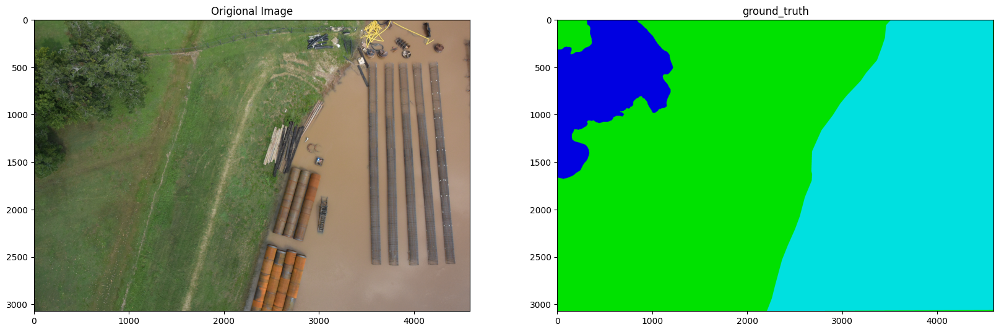

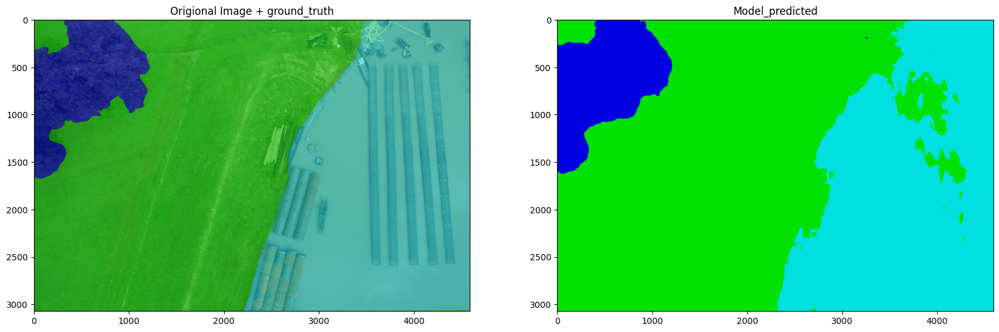




Test_Image # 12


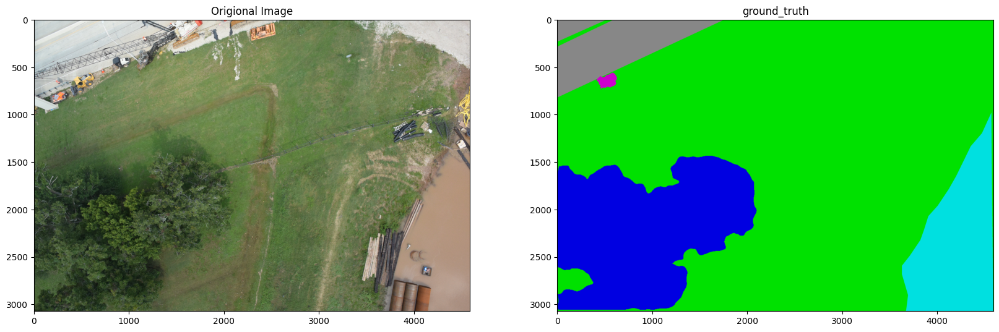

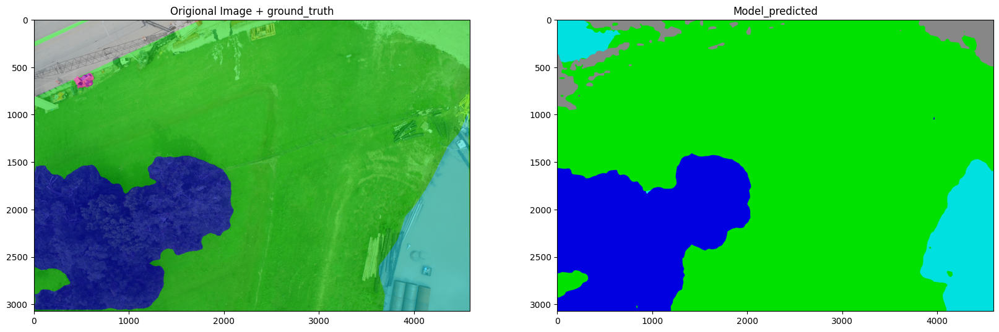

In [20]:
for x in range(9):
    idx1=x+4
    print("\n\n\nTest_Image #", idx1)
    evaluate_test(idx1=idx1)

In [21]:
cfg.model

{'backbone': {'attn_drop_rate': 0.0,
  'drop_path_rate': 0.1,
  'drop_rate': 0.0,
  'embed_dims': 64,
  'in_channels': 3,
  'mlp_ratio': 4,
  'num_heads': [1, 2, 5, 8],
  'num_layers': [3, 6, 40, 3],
  'num_stages': 4,
  'out_indices': (0, 1, 2, 3),
  'patch_sizes': [7, 3, 3, 3],
  'qkv_bias': True,
  'sr_ratios': [8, 4, 2, 1],
  'type': 'MixVisionTransformer'},
 'data_preprocessor': {'bgr_to_rgb': True,
  'mean': [123.675, 116.28, 103.53],
  'pad_val': 0,
  'seg_pad_val': 255,
  'size': (512, 512),
  'std': [58.395, 57.12, 57.375],
  'type': 'SegDataPreProcessor'},
 'decode_head': {'align_corners': False,
  'channels': 256,
  'dropout_ratio': 0.1,
  'in_channels': [64, 128, 320, 512],
  'in_index': [0, 1, 2, 3],
  'loss_decode': {'loss_weight': 1.0,
   'type': 'CrossEntropyLoss',
   'use_sigmoid': False},
  'norm_cfg': {'requires_grad': True, 'type': 'SyncBN'},
  'num_classes': 10,
  'type': 'SegformerHead'},
 'pretrained': None,
 'test_cfg': {'mode': 'whole'},
 'train_cfg': None,
 't

In [22]:
model

EncoderDecoder(
  (data_preprocessor): SegDataPreProcessor()
  (backbone): MixVisionTransformer(
    (layers): ModuleList(
      (0): ModuleList(
        (0): PatchEmbed(
          (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (norm): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
        )
        (1): ModuleList(
          (0): TransformerEncoderLayer(
            (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
            (attn): EfficientMultiheadAttention(
              (attn): MultiheadAttention(
                (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
              )
              (proj_drop): Dropout(p=0.0, inplace=False)
              (dropout_layer): DropPath()
              (sr): Conv2d(64, 64, kernel_size=(8, 8), stride=(8, 8))
              (norm): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
            )
            (norm2): LayerNorm((64,), eps=1e-06, el